In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
import os
import glob
import random
import gc

import pickle
import time
import tensorflow
import datetime
import math
import time

os.environ['KERAS_BACKEND'] = 'tensorflow'
#os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' # 3 = INFO, WARNING, and ERROR messages are not printed

from tqdm import tqdm

import numpy as np
import pandas as pd
from IPython.display import FileLink
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
%matplotlib inline
from IPython.display import display, Image
import matplotlib.image as mpimg
import cv2
import PIL
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.datasets import load_files       
from keras.utils import np_utils
from sklearn.utils import shuffle
from sklearn.metrics import log_loss

from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19


from keras.utils import to_categorical
from keras.models import Model
from keras import optimizers

from keras.layers import Dense,GlobalAveragePooling2D
from keras.applications import MobileNet
from keras.applications.mobilenet import preprocess_input

from sklearn.metrics import log_loss
from tensorflow.keras.losses import CategoricalCrossentropy
from sklearn.metrics import classification_report
from keras.callbacks import LearningRateScheduler

In [ ]:
dataset = pd.read_csv('/content/drive/My Drive/kaggle/state-farm-detection/driver_imgs_list.csv')
dataset.head(5)

,subject,classname,img
0,p002,c0,img_44733.jpg
1,p002,c0,img_72999.jpg
2,p002,c0,img_25094.jpg
3,p002,c0,img_69092.jpg
4,p002,c0,img_92629.jpg


In [ ]:
img_rows = 250
img_cols = 250
color_type = 3
activity_map = {'c0': 'Safe driving', 
                'c1': 'Texting - right', 
                'c2': 'Talking on the phone - right', 
                'c3': 'Texting - left', 
                'c4': 'Talking on the phone - left', 
                'c5': 'Operating the radio', 
                'c6': 'Drinking', 
                'c7': 'Reaching behind', 
                'c8': 'Hair and makeup', 
                'c9': 'Talking to passenger'}

**Reading images from drive**

In [ ]:
%%time

driver_details = pd.read_csv('/content/drive/My Drive/kaggle/state-farm-detection/driver_imgs_list.csv',na_values='na')

train_image = []
image_label = []


for i in range(10):
    print('now we are in the folder C',i)
    imgs = os.listdir("/content/drive/My Drive/kaggle/state-farm-detection/imgs/train/c"+str(i))
    print(len(imgs))
    for j in range(len(imgs)):               ########comment range(len(imgs)):#1300
    #for j in range(100):
        
        img_name = "/content/drive/My Drive/kaggle/state-farm-detection/imgs/train/c"+str(i)+"/"+imgs[j]
        img = cv2.imread(img_name)
        
        #img = Image.open(img_name)
        #wpercent = (img_rows/float(img.size[0]))
        #hsize = int((float(img.size[1])*float(wpercent)))
        #img = img.resize((img_rows,hsize), PIL.Image.ANTIALIAS)
        #img=np.array(img)
        #img=img/255
        
        #img = color.rgb2gray(img)
        #img = img[50:,120:-50]           ########uncomment to crop
        
        img = cv2.resize(img,(img_rows,img_cols))
        label = i
        driver = driver_details[driver_details['img'] == imgs[j]]['subject'].values[0]
        train_image.append([img,label,driver])
        image_label.append(i)
if not os.path.exists('cache'):        
        os.mkdir('cache')
        
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cacheTrain/train224.dat', 'wb')
pickle.dump(train_image, file)
file.close()


now we are in the folder C 0
2489
now we are in the folder C 1
2267
now we are in the folder C 2
2317
now we are in the folder C 3
2346
now we are in the folder C 4
2326
now we are in the folder C 5
2312
now we are in the folder C 6
2325
now we are in the folder C 7
2002
now we are in the folder C 8
1911
now we are in the folder C 9
2129
CPU times: user 3min 13s, sys: 34 s, total: 3min 47s
Wall time: 1h 34min 27s


In [ ]:
%%time
train_image = []
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cacheTrain/train250.dat', 'rb')
train_image=pickle.load(file)
file.close()

CPU times: user 1.54 s, sys: 4.6 s, total: 6.14 s
Wall time: 1min 56s


In [ ]:
len(train_image)

22424

In [ ]:
i = 0
fig, ax = plt.subplots(1, 2, figsize = (img_rows,img_cols ))
for i in range(2):
    #print ('Image number:',i)
    img = train_image[i][0]
    #img = color.rgb2gray(img)
    #\img = img[50:,120:-50]
    #img = cv2.resize(img,(img_rows,img_cols))
    
    ax[i].imshow(img)
    plt.show


In [ ]:
driv_selected =  ['p061', 'p035', 'p056', 'p052'] # ['p061', 'p035', 'p056', 'p052'] ['p050', 'p015', 'p022', 'p056','p042']
### NEW RANDOM SEARCH ['p014', 'p012', 'p064', 'p039'] 2.27 start

X_train= []
y_train = []
X_test = []
y_test = []
D_train = []
D_test = []
true_test = []

for features,labels,drivers in train_image:
    if drivers in driv_selected:
        X_test.append(features)
        y_test.append(labels)
        D_test.append(drivers)
        true_test.append(labels)
    
    else:
        X_train.append(features)
        y_train.append(labels)
        D_train.append(drivers)
    
print (len(X_train),len(X_test))
print (len(y_train),len(y_test))

19233 3191
19233 3191


In [ ]:
del D_test,D_train,true_test

In [ ]:
X_train = np.array(X_train)
X_test = np.array(X_test)

y_train = to_categorical(y_train)
y_test = to_categorical(y_test)
img_rows=X_train.shape[1]
img_cols=X_train.shape[2]
print(img_rows,img_cols)

print (X_train.shape)
print(y_train.shape)

250 250
(19233, 250, 250, 3)
(19233, 10)


In [ ]:
gc.collect()

354

In [ ]:
batch_size = 4 #648
nb_epoch =50

# **Ensemble**

In [ ]:
%%time
model1=model.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/mobilenet_sgd_extra_layers1.hdf5')
model2=modelXception.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/xception_weights_aug_extralayer_alltrained_sgd2_V2.hdf5')
#model3=model_vgg16.load_weights('../input/models/weights_best_vgg16.hdf5')
#model_vgg19.load_weights('../input/vgg19model/weights_best_vgg19.hdf5')
model4=resnet50_pretrained.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/resnet_weights_aug_alltrained_sgd2_setval2.hdf5')

pred1=model.predict(X_test)
pred2=modelXception.predict(X_test)
#pred3=model_vgg19.predict(X_test)
pred4=resnet50_pretrained.predict(X_test)

#finalpred=(pred1*0.6+pred4*0.9+pred2*0.3+pred3*0.3)/4
finalpred=(pred1*0.7+pred4*0.9)/2
#finalpred=(pred1+pred2+pred3)/3


CPU times: user 24.8 s, sys: 10.1 s, total: 35 s
Wall time: 42.7 s


In [ ]:
finalpred=(pred1+pred4+pred2*0.3)/3

In [ ]:
%%time
predictions_valid=finalpred
score = log_loss(y_test, predictions_valid)
print('Score log_loss: ', score)
val_pred=np.argmax(predictions_valid,axis=1)
val=np.argmax(y_test,axis=1)
print(classification_report(val, val_pred,target_names=activity_map))

Score log_loss:  0.12873175117300648
              precision    recall  f1-score   support

          c0       0.92      0.85      0.89       331
          c1       0.99      1.00      0.99       313
          c2       1.00      0.99      0.99       333
          c3       1.00      0.98      0.99       325
          c4       0.98      1.00      0.99       322
          c5       0.93      1.00      0.96       323
          c6       0.99      0.95      0.97       331
          c7       0.91      1.00      0.95       311
          c8       0.94      0.91      0.92       291
          c9       0.87      0.85      0.86       311

    accuracy                           0.95      3191
   macro avg       0.95      0.95      0.95      3191
weighted avg       0.95      0.95      0.95      3191

CPU times: user 11.3 ms, sys: 56 µs, total: 11.4 ms
Wall time: 10.9 ms


Image number: 0
Image number: 1
Image number: 2
Image number: 3
Image number: 4
Image number: 5
Image number: 6
Image number: 7
Image number: 8
Image number: 9
Image number: 10
Image number: 11
Image number: 12
Image number: 13
Image number: 14
Image number: 15
Image number: 16
Image number: 17
Image number: 18
Image number: 19


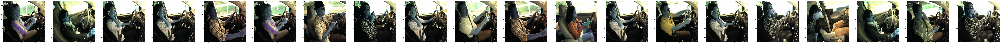

In [ ]:
test_image = []
i = 0
fig, ax = plt.subplots(1, 20, figsize = (img_rows,img_cols))

files = os.listdir('/content/drive/My Drive/kaggle/state-farm-detection/imgs/test20/')
nums = np.random.randint(low=1, high=len(files), size=20)
for i in range(20):
    print ('Image number:',i)
    img = cv2.imread('/content/drive/My Drive/kaggle/state-farm-detection/imgs/test20/'+files[nums[i]])
    #img = color.rgb2gray(img)
    #img = img[50:,120:-50]
    img = cv2.resize(img,(img_rows,img_cols))
    test_image.append(img)
    ax[i].imshow(img,cmap = 'gray')
    plt.show

In [ ]:
test = []

for img in test_image:
    test.append(img)
    

#model.load_weights('mobilenet_sgd_extra_layers.hdf5')

test = np.array(test).reshape(-1,img_rows,img_cols,color_type)
test.shape

(20, 224, 224, 3)

In [ ]:
%%time
model1=model.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/mobilenet_sgd_extra_layers1.hdf5')
model2=modelXception.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/xception_weights_aug_extralayer_alltrained_sgd2_V2.hdf5')
#model3=model_vgg16.load_weights('../input/models/weights_best_vgg16.hdf5')
#model_vgg19.load_weights('../input/vgg19model/weights_best_vgg19.hdf5')
model4=resnet50_pretrained.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/resnet_weights_aug_alltrained_sgd2_setval2.hdf5')

pred1=model.predict(test)
pred2=modelXception.predict(test)
#pred3=model_vgg19.predict(X_test)
pred4=resnet50_pretrained.predict(test)

#finalpred=(pred1*0.6+pred4*0.9+pred2*0.3+pred3*0.3)/4
finalpred=(pred1*0.7+pred4*0.9)/2
#finalpred=(pred1+pred2+pred3)/3


CPU times: user 895 ms, sys: 383 ms, total: 1.28 s
Wall time: 1.9 s


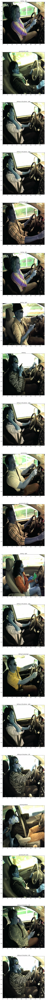

In [ ]:
#prediction=knn_predictions
prediction=finalpred

tags = { "C0": "safe driving",
"C1": "texting - right",
"C2": "talking on the phone - right",
"C3": "texting - left",
"C4": "talking on the phone - left",
"C5": "operating the radio",
"C6": "drinking",
"C7": "reaching behind",
"C8": "hair and makeup",
"C9": "talking to passenger" }

i = 0
fig, ax = plt.subplots(20, 1, figsize = (img_rows,img_cols))

for i in range(20):
    ax[i].imshow(test[i].squeeze())
    predicted_class = 'C'+str(np.where(prediction[i] == np.amax(prediction[i]))[0][0])
    ax[i].set_title(tags[predicted_class])
    plt.show

In [ ]:
len(test_image)

2

In [ ]:
## Defining the input

from keras.layers import Input
vgg16_input = Input(shape = (224, 224, 3), name = 'Image_input')


## The VGG model

from keras.applications.vgg16 import VGG16, preprocess_input

#Get back the convolutional part of a VGG network trained on ImageNet
model_vgg16_conv = VGG16(weights='imagenet', include_top=False, input_tensor = vgg16_input)
#model_vgg16_conv.summary()
print('Model Loaded')

# **KNN**

In [ ]:
from keras.layers import Input
vgg19_input = Input(shape = (42, 56, 3), name = 'Image_input')


## The VGG model

from keras.applications.vgg19 import VGG19, preprocess_input

#Get back the convolutional part of a VGG network trained on ImageNet
model_vgg19_conv = VGG19(weights='imagenet', include_top=False, input_tensor = vgg19_input)
#model_vgg16_conv.summary()
print('Model Loaded')

Model Loaded


In [ ]:
%%time
vgg19_features_output=model_vgg19_conv.predict(test)
vgg19_features_output.shape

CPU times: user 1h 12min 52s, sys: 20.3 s, total: 1h 13min 12s
Wall time: 18min 58s


In [ ]:
vgg19_features_output.shape

(79726, 1, 1, 512)

In [ ]:

knn_input=np.reshape(vgg19_features_output,(vgg19_features_output.shape[0],-1))

In [ ]:
knn_input.shape

(79726, 512)

In [ ]:
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test100_knninput.dat', 'rb')
knn_input=pickle.load(file)
file.close()

In [ ]:
%%time
from sklearn.neighbors import NearestNeighbors
nbrs = NearestNeighbors(n_neighbors=10).fit(knn_input)
print("Done")

distances, indices = nbrs.kneighbors(knn_input)
len(indices)#56 min
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test56_42_vgg19_indices.dat', 'wb')
pickle.dump( [distances, indices], file)
file.close()

Done
CPU times: user 1h 22min 41s, sys: 325 ms, total: 1h 22min 42s
Wall time: 1h 22min 44s


In [ ]:
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test56_42_1.dat', 'rb')
test=pickle.load(file)
file.close()

In [ ]:
test_knn_input.shape

(79726, 4608)

In [ ]:
%%time
from sklearn.neighbors import NearestNeighbors
nbrs = NearestNeighbors(n_neighbors=10).fit(test_knn_input)
print("Done")

Done
CPU times: user 2min 16s, sys: 2.04 s, total: 2min 18s
Wall time: 2min 18s


In [ ]:
%%time
distances, indices = nbrs.kneighbors(test_knn_input)
len(indices)#56 min
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test112_indices.dat', 'wb')
pickle.dump( [distances, indices], file)
file.close()

In [ ]:
test_knn = []
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test56_indices.dat', 'rb')
test_knn=pickle.load(file)
file.close()
distancess,indices=test_knn

In [ ]:
%%time
test_images = []
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test56_42_1.dat', 'rb')
test_images=pickle.load(file)
file.close()
test=test_images

CPU times: user 197 ms, sys: 358 ms, total: 555 ms
Wall time: 6.18 s


In [ ]:
ensem_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/cache/submission_ens-half1_2020-06-30-19-40+half2+half3+half4.csv",index_col=False)


In [ ]:
sorted_ensem_df=ensem_df.sort_values(by=['img'])

In [ ]:
sorted_ensem_df


,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9,img
55147,1.860000e-05,2.807450e-04,0.001189,1.582992e-03,1.220000e-05,7.634502e-01,5.480000e-06,3.280000e-05,0.000085,0.000010,img_1.jpg
29507,3.770000e-05,5.970000e-06,0.000006,8.260000e-06,1.410000e-05,7.665591e-01,8.430000e-06,3.080000e-06,0.000022,0.000002,img_10.jpg
12060,7.421864e-01,2.182240e-04,0.000081,2.850000e-06,1.650000e-05,2.173900e-04,9.124180e-04,7.180000e-05,0.015860,0.007100,img_100.jpg
74498,1.290000e-07,1.430000e-08,0.000001,1.860000e-08,6.710000e-07,4.480000e-07,5.500000e-07,1.440000e-07,0.766643,0.000020,img_1000.jpg
61757,6.620000e-05,2.116270e-04,0.000092,7.610518e-01,4.332845e-03,1.415560e-04,3.456320e-04,3.230000e-05,0.000100,0.000293,img_100000.jpg
...,...,...,...,...,...,...,...,...,...,...,...
18663,4.280000e-06,7.537050e-01,0.010165,2.400000e-07,1.170000e-07,2.460000e-06,2.170000e-06,2.767804e-03,0.000011,0.000008,img_99994.jpg
61266,1.271740e-04,1.482851e-03,0.000032,7.633827e-01,4.050620e-04,1.472700e-04,8.772510e-04,3.270000e-05,0.000052,0.000128,img_99995.jpg
12815,2.180000e-06,2.852580e-04,0.000025,1.229626e-03,7.637674e-01,3.550000e-06,2.480000e-05,3.090000e-05,0.001296,0.000001,img_99996.jpg
49066,4.978500e-04,3.348670e-04,0.001180,5.979270e-04,2.037490e-04,5.600850e-04,7.618831e-01,4.925410e-04,0.000709,0.000207,img_99998.jpg


In [ ]:
ensem=sorted_ensem_df.to_numpy()
ensem[0][:10]

array([1.86e-05, 0.000280745, 0.001188675, 0.001582992, 1.22e-05,
       0.76345015, 5.48e-06, 3.28e-05, 8.540000000000002e-05, 9.69e-06],
      dtype=object)

In [ ]:
indices.shape[0]

79726

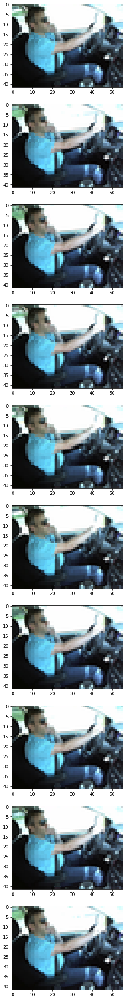

In [ ]:
fig, ax = plt.subplots(10, 1, figsize = (56,42))

img = 0

for i in indices[50000]:  
    ax[img].imshow(test[i])
    plt.show
    img = img+1
    

In [ ]:
done=0

In [ ]:
num=0
final=indices.shape[0]
if final-(done+10000)<=0:
  print("its time")
else:
  num=done
  done+=10000
  print(num,done)



0 10000


In [ ]:
def create_submission(predictions, test_id, info):
    result1 = pd.DataFrame(predictions, columns=['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9'])
    result1.loc[:, 'img'] = pd.Series(test_id, index=result1.index)
    now = datetime.datetime.now()
    if not os.path.isdir('/content/drive/My Drive/kaggle/state-farm-detection/subms'):
        os.mkdir('/content/drive/My Drive/kaggle/state-farm-detection/subms')
    suffix = info + '_' + str(now.strftime("%Y-%m-%d-%H-%M"))
    sub_file = os.path.join('/content/drive/My Drive/kaggle/state-farm-detection/subms', 'submission_' + suffix + '.csv')
    result1.to_csv(sub_file, index=False)

In [ ]:
five_indices=indices[:,:5]

In [ ]:
five_indices[0]

array([    0,  7741, 10535, 57421, 76405])

In [ ]:
num=0
done=79726

In [ ]:
%%time
knn_predictions = []
predictions = []



for i in range(num,done):#indices.shape[0]):
    mean_prediction = []
   
    print("Image Number: "+str(i))
    print('')
    for j in range(len(ensem[0])-1):
        for img in five_indices[i]:
            #print(img)
            
            ensemble_prediction=ensem[img][:10]
            #print(ensem[k][10],id)
            #print(ensemble_prediction)
                
            #print(ensemble_prediction[j])
            predictions.append(ensemble_prediction[j])
        #print("herrer")
        #trimmed_value = (sum(predictions) - max(predictions) - min(predictions))/(len(predictions) -2 )
        
        mean_value = np.mean(predictions)
        predictions = []
        
    
        mean_prediction.append(mean_value)
        
    
    
    mean_prediction = np.asarray(mean_prediction)/sum(mean_prediction)
    
    knn_predictions.append(mean_prediction)
    
knn_predictions = np.asarray(knn_predictions)           
 

        
print('The code is done')
knn_class = []
ensembles=ensem[num:done]
for i in range(len(knn_predictions)):
    knn_class.append(np.where(knn_predictions[i] == np.amax(knn_predictions[i]))[0][0])
info_string='knn-half56_42_5'
create_submission(knn_predictions, ensembles[:,10], info_string)
print("csv created")


Streaming output truncated to the last 5000 lines.

Image Number: 77229

Image Number: 77230

Image Number: 77231

Image Number: 77232

Image Number: 77233

Image Number: 77234

Image Number: 77235

Image Number: 77236

Image Number: 77237

Image Number: 77238

Image Number: 77239

Image Number: 77240

Image Number: 77241

Image Number: 77242

Image Number: 77243

Image Number: 77244

Image Number: 77245

Image Number: 77246

Image Number: 77247

Image Number: 77248

Image Number: 77249

Image Number: 77250

Image Number: 77251

Image Number: 77252

Image Number: 77253

Image Number: 77254

Image Number: 77255

Image Number: 77256

Image Number: 77257

Image Number: 77258

Image Number: 77259

Image Number: 77260

Image Number: 77261

Image Number: 77262

Image Number: 77263

Image Number: 77264

Image Number: 77265

Image Number: 77266

Image Number: 77267

Image Number: 77268

Image Number: 77269

Image Number: 77270

Image Number: 77271

Image Number: 77272

Image Number: 77273

Ima

In [ ]:
ensembles=ensem[num:done]
ensembles[:,10]

array(['img_1.jpg', 'img_10.jpg', 'img_100.jpg', ..., 'img_19558.jpg',
       'img_1956.jpg', 'img_19560.jpg'], dtype=object)

In [ ]:
def create_submission(predictions, test_id, info):
    result1 = pd.DataFrame(predictions, columns=['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9'])
    result1.loc[:, 'img'] = pd.Series(test_id, index=result1.index)
    now = datetime.datetime.now()
    if not os.path.isdir('/content/drive/My Drive/kaggle/state-farm-detection/subms'):
        os.mkdir('/content/drive/My Drive/kaggle/state-farm-detection/subms')
    suffix = info + '_' + str(now.strftime("%Y-%m-%d-%H-%M"))
    sub_file = os.path.join('/content/drive/My Drive/kaggle/state-farm-detection/subms', 'submission_' + suffix + '.csv')
    result1.to_csv(sub_file, index=False)

In [ ]:
info_string='knn-half11'
create_submission(knn_predictions, test_id[done:indices.shape[0]], info_string)
print("csv created")
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test32_knn_pred_11.dat', 'wb')
pickle.dump(knn_predictions, file)
file.close()
print("File Dumped!")

csv created
File Dumped!


In [ ]:
info_string='knn-half2'
create_submission(knn_predictions, test_id[num:done], info_string)
print("csv created")
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test32_knn_pred_2.dat', 'wb')
pickle.dump(knn_predictions, file)
file.close()
print("File Dumped!")

csv created
File Dumped!


In [ ]:
info_string='knn-half1'
create_submission(prediction, test_id1, info_string)

In [ ]:
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test32_knn_pred.dat', 'wb')
pickle.dump(knn_predictions, file)
file.close()

In [ ]:
img_rows,img_cols=56,42

In [ ]:
len(max_prediction)

10

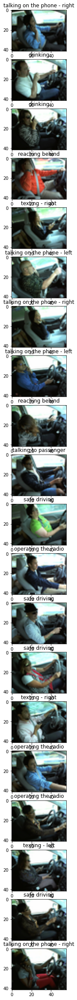

In [ ]:
img_rows=56

img_cols=42
#prediction=knn_predictions
prediction=knn_predictions

tags = { "C0": "safe driving",
"C1": "texting - right",
"C2": "talking on the phone - right",
"C3": "texting - left",
"C4": "talking on the phone - left",
"C5": "operating the radio",
"C6": "drinking",
"C7": "reaching behind",
"C8": "hair and makeup",
"C9": "talking to passenger" }

i = 0
j=0
fig, ax = plt.subplots(20, 1, figsize = (img_rows,img_cols))

for i in range(20,40):
    ax[j].imshow(test[i].squeeze())
    predicted_class = 'C'+str(np.argmax(prediction[i]))
    pred_class='C'+str(knn_class[i])
    ax[j].set_title(tags[predicted_class])
    j=j+1
    
    plt.show

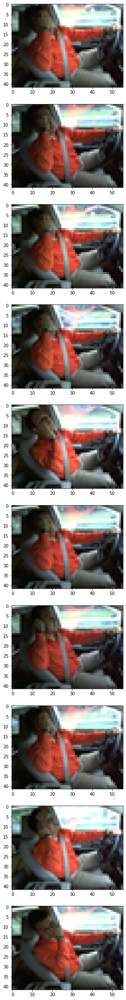

In [ ]:
fig, ax = plt.subplots(10, 1, figsize = (56,42))

img = 0

for i in indices[23]:  
    ax[img].imshow(test[i])
    plt.show
    img = img+1
    

In [ ]:
len(knn_class)

100

In [ ]:
knn_class[:3]

[5, 5, 0]

In [ ]:
np.argmax(knn_predictions[:3],axis=1)

array([5, 5, 0])

In [ ]:
knn_input.shape

(79726, 4608)

In [ ]:
ensem_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/subms/preds/submission_predEnsembleTrimmed3_2020-07-15-16-39.csv",index_col=False)
ensem=ensem_df.to_numpy()
ensem[0][1:]

array([0.000478384, 1.36e-05, 8.98e-05, 0.0007475660000000001,
       1.7100000000000002e-05, 0.9888550209999999, 9.15e-06,
       5.2000000000000004e-05, 0.00016711299999999998, 0.00957029],
      dtype=object)

In [ ]:
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test100_knninput.dat', 'rb')
knn_input=pickle.load(file)
file.close()

In [ ]:
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test100_knninput.dat', 'rb')
knn_input=pickle.load(file)
file.close()

In [ ]:
a=int(79726/4)
b=a+a
c=b+a
d=79726
print(a,b,c,d)

19931 39862 59793 79726


In [ ]:
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test100_knninput.dat', 'rb')
knn_input=pickle.load(file)
file.close()

In [ ]:
%%time
from sklearn.neighbors import KDTree
tree= KDTree(knn_input)
dist,ind=tree.query(knn_input[:1], k=10)   

CPU times: user 1min 55s, sys: 1.34 s, total: 1min 57s
Wall time: 1min 56s


In [ ]:
ind #[    0, 76405, 77195, 54618, 10535, 55935, 65588, 49517, 48222,    49882]])

array([[    0, 76405, 77195, 54618, 10535, 55935, 65588, 49517, 48222,
        49882]])

In [ ]:
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test100.dat', 'rb')
test=pickle.load(file)
file.close()

In [ ]:
len(test)

79726

In [ ]:
%%time
dist,ind=tree.query(knn_input[0:1], k=10) 

CPU times: user 730 ms, sys: 0 ns, total: 730 ms
Wall time: 730 ms


In [ ]:
ind #[[    0, 76405, 77195, 54618, 10535, 55935, 65588, 49517, 48222,     49882]])

array([[    0, 76405, 77195, 54618, 10535, 55935, 65588, 49517, 48222,
        49882]])

In [ ]:
num=0
done=a

In [ ]:
%%time
knn_predictions = []
knn_predictions_trimmed=[]
predictions = []



for i in range(num,done):#indices.shape[0]):
    mean_prediction = []
    mean_prediction_trimmed=[]
   
    print("Image Number: "+str(i))
    print('')
    dist,ind=tree.query(knn_input[i:i+1], k=10) 
    for j in range(len(ensem[0])-1):
        for img in ind[0]:
            #print(img)
            
            ensemble_prediction=ensem[img][1:]
            #print(ensem[k][10],id)
            #print(ensemble_prediction)
                
            #print(ensemble_prediction[j])
            predictions.append(ensemble_prediction[j])
        #print("herrer")
        trimmed_value = (sum(predictions) - max(predictions) - min(predictions))/(len(predictions) -2 )
        
        mean_value = np.mean(predictions)
        predictions = []
        
    
        mean_prediction.append(mean_value)
        mean_prediction_trimmed.append(trimmed_value)
    
    
    mean_prediction = np.asarray(mean_prediction)/sum(mean_prediction)
    mean_prediction_trimmed = np.asarray(mean_prediction_trimmed)/sum(mean_prediction_trimmed)

    knn_predictions.append(mean_prediction)
    knn_predictions_trimmed.append(mean_prediction_trimmed)

knn_predictions = np.asarray(knn_predictions)           
knn_predictions_trimmed = np.asarray(knn_predictions_trimmed) 

        
print('The code is done')
knn_class = []
ensembles=ensem[num:done]
for i in range(len(knn_predictions)):
    knn_class.append(np.where(knn_predictions[i] == np.amax(knn_predictions[i]))[0][0])
info_string='kd-100_trimmed3_1'
create_submission(knn_predictions, ensembles[:,1], info_string)
print("csv created")

info_string='kd-100_NOTtrimmed3_1'
create_submission(knn_predictions, ensembles[:,1], info_string)
print("csv created")



Streaming output truncated to the last 5000 lines.

Image Number: 37365

Image Number: 37366

Image Number: 37367

Image Number: 37368

Image Number: 37369

Image Number: 37370

Image Number: 37371

Image Number: 37372

Image Number: 37373

Image Number: 37374

Image Number: 37375

Image Number: 37376

Image Number: 37377

Image Number: 37378

Image Number: 37379

Image Number: 37380

Image Number: 37381

Image Number: 37382

Image Number: 37383

Image Number: 37384

Image Number: 37385

Image Number: 37386

Image Number: 37387

Image Number: 37388

Image Number: 37389

Image Number: 37390

Image Number: 37391

Image Number: 37392

Image Number: 37393

Image Number: 37394

Image Number: 37395

Image Number: 37396

Image Number: 37397

Image Number: 37398

Image Number: 37399

Image Number: 37400

Image Number: 37401

Image Number: 37402

Image Number: 37403

Image Number: 37404

Image Number: 37405

Image Number: 37406

Image Number: 37407

Image Number: 37408

Image Number: 37409

Ima

In [ ]:
def create_submission(predictions, test_id, info):
    result1 = pd.DataFrame(predictions, columns=['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9'])
    result1.loc[:, 'img'] = pd.Series(test_id, index=result1.index)
    now = datetime.datetime.now()
    if not os.path.isdir('/content/drive/My Drive/kaggle/state-farm-detection/subms/final'):
        os.mkdir('/content/drive/My Drive/kaggle/state-farm-detection/subms/final')
    suffix = info + '_' + str(now.strftime("%Y-%m-%d-%H-%M"))
    sub_file = os.path.join('/content/drive/My Drive/kaggle/state-farm-detection/subms/final', 'submission_' + suffix + '.csv')
    result1.to_csv(sub_file, index=False)

In [ ]:
%%time
knn_predictions = []
knn_predictions_trimmed=[]
predictions = []



for i in range(num,done):#indices.shape[0]):
    mean_prediction = []
    mean_prediction_trimmed=[]
   
    print("Image Number: "+str(i))
    print('')
    dist,ind=tree.query(knn_input[i:i+1], k=10) 
    for j in range(len(ensem[0])-1):
        for img in ind[0]:
            #print(img)
            
            ensemble_prediction=ensem[img][1:]
            #print(ensem[k][10],id)
            #print(ensemble_prediction)
                
            #print(ensemble_prediction[j])
            predictions.append(ensemble_prediction[j])
        #print("herrer")
        trimmed_value = (sum(predictions) - max(predictions) - min(predictions))/(len(predictions) -2 )
        
        mean_value = np.mean(predictions)
        predictions = []
        
    
        mean_prediction.append(mean_value)
        mean_prediction_trimmed.append(trimmed_value)
    
    
    mean_prediction = np.asarray(mean_prediction)/sum(mean_prediction)
    mean_prediction_trimmed = np.asarray(mean_prediction_trimmed)/sum(mean_prediction_trimmed)

    knn_predictions.append(mean_prediction)
    knn_predictions_trimmed.append(mean_prediction_trimmed)

knn_predictions = np.asarray(knn_predictions)           
knn_predictions_trimmed = np.asarray(knn_predictions_trimmed) 

        
print('The code is done')
knn_class = []
ensembles=ensem[num:done]
for i in range(len(knn_predictions)):
    knn_class.append(np.where(knn_predictions[i] == np.amax(knn_predictions[i]))[0][0])
info_string='kd-100_trimmed3_1'
create_submission(knn_predictions_trimmed, ensembles[:,1], info_string)
print("csv created")

info_string='kd-100_NOTtrimmed3_1'
create_submission(knn_predictions, ensembles[:,1], info_string)
print("csv created")



Streaming output truncated to the last 5000 lines.
Image Number: 17434

Image Number: 17435

Image Number: 17436

Image Number: 17437

Image Number: 17438

Image Number: 17439

Image Number: 17440

Image Number: 17441

Image Number: 17442

Image Number: 17443

Image Number: 17444

Image Number: 17445

Image Number: 17446

Image Number: 17447

Image Number: 17448

Image Number: 17449

Image Number: 17450

Image Number: 17451

Image Number: 17452

Image Number: 17453

Image Number: 17454

Image Number: 17455

Image Number: 17456

Image Number: 17457

Image Number: 17458

Image Number: 17459

Image Number: 17460

Image Number: 17461

Image Number: 17462

Image Number: 17463

Image Number: 17464

Image Number: 17465

Image Number: 17466

Image Number: 17467

Image Number: 17468

Image Number: 17469

Image Number: 17470

Image Number: 17471

Image Number: 17472

Image Number: 17473

Image Number: 17474

Image Number: 17475

Image Number: 17476

Image Number: 17477

Image Number: 17478

Imag

# Test ensemble models

In [ ]:
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test100.dat', 'rb')
test=pickle.load(file)
file.close()
print(len(test))

79726


In [ ]:
ensem_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/cache/submission_ens-half1_2020-06-30-19-40+half2+half3+half4.csv",index_col=False)
sorted_ensem_df=ensem_df.sort_values(by=['img'])
ensem=sorted_ensem_df.to_numpy()
ensem[0][:10]

array([1.86e-05, 0.000280745, 0.001188675, 0.001582992, 1.22e-05,
       0.76345015, 5.48e-06, 3.28e-05, 8.540000000000002e-05, 9.69e-06],
      dtype=object)

In [ ]:
pred0_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/subms/preds/submission_p0_1_2020-07-15-12-17+2+3+4.csv",index_col=False)
pred0=pred0_df.to_numpy()
pred0[0][1:]

array([0.001558336, 8.66e-06, 0.000313391, 0.000387123, 3.62e-06,
       0.99353904, 6.97e-06, 7.900000000000001e-05,
       0.00025729400000000003, 0.003846601], dtype=object)

In [ ]:
pred1_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/subms/preds/submission_p1_1_2020-07-15-12-18+2+3+4.csv",index_col=False)
pred1=pred1_df.to_numpy()
pred1[0][1:]

array([0.000801543, 1.6e-06, 4.34e-06, 0.00023135, 1.56e-05,
       0.9955576999999999, 3.58e-06, 1.8600000000000002e-07, 0.000116325,
       0.003267835], dtype=object)

In [ ]:
pred2_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/subms/preds/submission_p2_1_2020-07-15-12-18+2+3+$.csv",index_col=False)
pred2=pred2_df.to_numpy()
pred2[0][1:]

array([0.027573667000000003, 0.000563521, 0.001118684, 0.005512195,
       0.000436792, 0.47065288, 0.001875503, 0.007193671,
       0.027850237000000003, 0.45722294], dtype=object)

In [ ]:
pred3_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/subms/preds/submission_p3_1_2020-07-15-12-19+2+3+4.csv",index_col=False)
pred3=pred3_df.to_numpy()
pred3[0][1:]

array([5.629999999999999e-05, 6.26e-07, 3.3599999999999996e-08, 4.34e-08,
       1.06e-07, 0.9501405999999999, 1.27e-06, 8.95e-09,
       4.270000000000001e-05, 0.049758315], dtype=object)

In [ ]:
pred4_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/subms/preds/submission_p4_1_2020-07-15-12-19+2+3+4.csv",index_col=False)
pred4=pred4_df.to_numpy()
pred4[0][1:]

array([2.08e-05, 1.04e-06, 1.37e-07, 1.23e-05, 1.36e-06,
       0.9054306999999999, 9.3e-07, 1.13e-05, 4.6e-05, 0.09447544],
      dtype=object)

In [ ]:
pred5_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/subms/preds/submission_p5_1_2020-07-15-13-30+2+3+4.csv",index_col=False)
pred5=pred5_df.to_numpy()
pred5[0][1:]

array([5.3400000000000004e-05, 0.000840095, 0.003565225, 0.004714245,
       2.56e-05, 0.99041873, 1.36e-05, 9.81e-05, 0.00025017700000000003,
       2.08e-05], dtype=object)

In [ ]:
pred6_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/subms/preds/submission_p6_1_2020-07-15-13-30+2+3+4.csv",index_col=False)
pred6=pred6_df.to_numpy()
pred6[0][1:]

array([6.73e-06, 7.12e-06, 1.93e-06, 2.2800000000000002e-05, 2.46e-05,
       0.9998789, 9.34e-06, 6.88e-07, 2.0399999999999998e-05, 2.75e-05],
      dtype=object)

In [ ]:
pred8_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/subms/preds/submission_p8_1_2020-07-15-13-30+2+3+4.csv",index_col=False)
pred8=pred8_df.to_numpy()
pred8[0][1:]

array([4.85e-06, 4.07e-06, 1.37e-06, 0.001851356, 1.29e-05, 0.99770844,
       4.58e-06, 5.6600000000000004e-08, 9.66e-07, 0.00041151199999999995],
      dtype=object)

ensemble

In [ ]:
pred0=pred0[:,1:]
pred1=pred1[:,1:]
pred2=pred2[:,1:]
pred3=pred3[:,1:]
pred4=pred4[:,1:]
pred5=pred5[:,1:]
pred6=pred6[:,1:]
pred8=pred8[:,1:]

In [ ]:
predictions1=(pred0*0.9+pred1*0.4+pred2*0.05+pred3*0.05)/5
predictions2=(pred5+pred6*0.05+pred8*0.7)/3
pred=(predictions1*0.5+predictions2)/2

In [ ]:
len(pred)

79726

In [ ]:
from statistics import mean,median

predictions = []
ensemble_predictions = []

for i in range(len(test)):
#for i in range(1):
    mean_prediction = []
    
    for j in range(10):
        #predictions.append(pred0[i][j]*0.9)
        #predictions.append(pred1[i][j]*0.4)
        #predictions.append(pred2[i][j]*0.05)
        #predictions.append(pred3[i][j]*0.05)
        #predictions.append(pred4[i][j]*0.9)

        #predictions.append(pred5[i][j])
        #predictions.append(pred6[i][j]*0.05)
        #predictions.append(pred8[i][j]*0.7)
       
        predictions.append(pred0[i][j]*0.7)
        predictions.append(pred1[i][j]*0.4)
        predictions.append(pred2[i][j]*0.05)
        predictions.append(pred3[i][j]*0.05)
        predictions.append(pred4[i][j]*0.7)

        predictions.append(pred5[i][j])
        predictions.append(pred6[i][j]*0.4)
        predictions.append(pred8[i][j]*0.9)
        
        trimmed_value = (sum(predictions) - max(predictions) - min(predictions))/(len(predictions) -2 )
        
        mean_value =np.mean(predictions)

        predictions = []
        mean_prediction.append(trimmed_value)
        #mean_prediction.append(mean_value)
    
    mean_prediction = np.asarray(mean_prediction)/ sum(mean_prediction)
    ensemble_predictions.append(mean_prediction)
        
    
ensemble_predictions = np.asarray(ensemble_predictions)        
print('Got predictions from ensemble')

Got predictions from ensemble


In [ ]:
def create_submission(predictions, info):
    result1 = pd.DataFrame(predictions, columns=['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9'])
    #result1.loc[:, 'img'] = pd.Series(test_id, index=result1.index)
    now = datetime.datetime.now()
    if not os.path.isdir('/content/drive/My Drive/kaggle/state-farm-detection/subms'):
        os.mkdir('/content/drive/My Drive/kaggle/state-farm-detection/subms')
    suffix = info + '_' + str(now.strftime("%Y-%m-%d-%H-%M"))
    sub_file = os.path.join('/content/drive/My Drive/kaggle/state-farm-detection/subms', 'submission_' + suffix + '.csv')
    result1.to_csv(sub_file, index=False)

In [ ]:
info="predEnsembleNOTTrimmed3"
create_submission(ensemble_predictions, info)

# Result

<function matplotlib.pyplot.show>

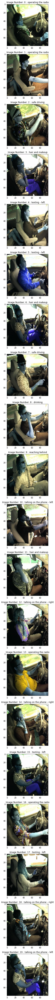

In [ ]:
pred=ensemble_predictions   #ensem
tags = { "C0": "safe driving",
"C1": "texting - right",
"C2": "talking on the phone - right",
"C3": "texting - left",
"C4": "talking on the phone - left",
"C5": "operating the radio",
"C6": "drinking",
"C7": "reaching behind",
"C8": "hair and makeup",
"C9": "talking to passenger" }
fig, ax = plt.subplots(20, 1 ,figsize = (100,100))

img = 0

for i in range(0,20):  
    ax[img].imshow(test[i])
    ax[img].set_title("Image Number: "+str(i)+" : "+tags['C'+str(np.argmax(pred[i]))])
    
    
    
    img = img+1
plt.show